# Stock Market Insights & Predictive Modeling: Historical Trends, Risk Analysis, and Strategy Backtesting

## Objective
- To analyze historical stock index data since 1965, uncover long-term trends and risk profiles, develop a trading strategy.
- This project aims to showcase skills in data analysis, visualization, financial metrics, time-series modeling, and business decision-making.

## Data Set
This dataset consists of stock exchange data since 1965 for several indexes. It contains the daily stock prices along with the volume traded each day.

[Source](https://www.kaggle.com/mattiuzc/stock-exchange-data) of dataset : Kaggle

| Column            | Explanation                                                                                             |
| ----------------- | ------------------------------------------------------------------------------------------------------- |
| Ticker            | Ticker symbol for indexes
| Date              | Data of observation
| Open              | Opening price
| High              | Highest price during trading day
| Low               | Lowest price during trading day
| Close             | Close price


# Data Collection and Cleaning
- Parse dates, handle missing values, ensure sorted time series per ticker.
- Adjust prices for inflation (optional advanced step).

In [4]:
# ---- Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance

In [5]:
# ---- Plot style
pd.set_option('display.float_format', lambda x: f'{x:,.4f}')
plt.rcParams['figure.figsize'] = (10, 5)
sns.set_theme(context='notebook', style='whitegrid')

In [6]:
# ---- Load dataset
df = pd.read_csv("stock_data.csv")
df.head()

,ticker,date,open,high,low,close
0,HSI,12/31/1986,"2,568.3000","2,568.3000","2,568.3000","2,568.3000"
1,HSI,1/2/1987,"2,540.1001","2,540.1001","2,540.1001","2,540.1001"
2,HSI,1/5/1987,"2,552.3999","2,552.3999","2,552.3999","2,552.3999"
3,HSI,1/6/1987,"2,583.8999","2,583.8999","2,583.8999","2,583.8999"
4,HSI,1/7/1987,"2,607.1001","2,607.1001","2,607.1001","2,607.1001"


In [7]:
# ---- Check basic info
print("Shape:", df.shape)
print("Columns:", df.columns.tolist())

Shape: (104224, 6)
Columns: ['ticker', 'date', 'open', 'high', 'low', 'close']


In [8]:
# ---- Convert date column
df['date'] = pd.to_datetime(df['date'], errors='coerce', infer_datetime_format=True)

In [9]:
# ---- Convert price columns to numeric
float_cols = ['open', 'high', 'low', 'close']
for col in float_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

In [10]:
# ---- Remove rows with missing dates
df = df.dropna(subset=['date'])

In [11]:
# ---- Remove duplicates & sort
df = df.drop_duplicates(subset=['ticker', 'date'])
df = df.sort_values(['ticker', 'date']).reset_index(drop=True)

In [12]:
# ---- Fill missing OHLC values within each ticker (forward/backward fill)
df[float_cols] = df.groupby('ticker')[float_cols].apply(lambda g: g.ffill().bfill()).values

In [13]:
# ---- Sanity checks
# 1. No negative prices
neg_prices = (df[float_cols] < 0).sum()
print("Negative price counts:\n", neg_prices)

# 2. Price envelope violations (low <= open/close <= high)
violations = ((df['low'] > df[['open', 'close']].min(axis=1)) |
              (df['high'] < df[['open', 'close']].max(axis=1))).sum()
print(f"OHLC envelope violations: {violations}")

Negative price counts:
 open     0
high     0
low      0
close    0
dtype: int64
OHLC envelope violations: 0


In [14]:
# ---- Add daily return columns
df['return'] = df.groupby('ticker')['close'].pct_change()
df['log_return'] = np.log1p(df['return'])

In [15]:
# ---- Summary
print("\nDate range:", df['date'].min().date(), "to", df['date'].max().date())
print("Tickers:", df['ticker'].nunique(), "-", sorted(df['ticker'].unique()))



Date range: 1965-01-05 to 2021-06-03
Tickers: 13 - ['000001.SS', '399001.SZ', 'GDAXI', 'GSPTSE', 'HSI', 'IXIC', 'J203.JO', 'N100', 'N225', 'NSEI', 'NYA', 'SSMI', 'TWII']


In [16]:
df.head()

,ticker,date,open,high,low,close,return,log_return
0,000001.SS,1997-07-02,"1,255.9091","1,261.5710","1,147.3311","1,199.0610",NaN,NaN
1,000001.SS,1997-07-03,"1,194.6760","1,194.6760","1,149.9399","1,150.6230",-0.0404,-0.0412
2,000001.SS,1997-07-04,"1,138.9210","1,163.2490","1,124.7760","1,159.3420",0.0076,0.0075
3,000001.SS,1997-07-07,"1,161.7070","1,163.4470","1,085.5720","1,096.8190",-0.0539,-0.0554
4,000001.SS,1997-07-08,"1,092.7990","1,115.4330","1,066.0439","1,109.6660",0.0117,0.0116


# Exploratory Data Analysis
- Summary stats, outlier detection, price trends visualization.
- Interactive charts with Plotly.

In [17]:
# ---- 1. Ticker Coverage & Summary Stats
coverage = df.groupby('ticker').agg(
    start_date=('date', 'min'),
    end_date=('date', 'max'),
    total_days=('date', 'count'),
    mean_close=('close', 'mean'),
    median_close=('close', 'median'),
    volatility=('return', 'std')
).sort_values(by='total_days', ascending=False)

print("=== Coverage & Summary ===")
display(coverage)

=== Coverage & Summary ===


,start_date,end_date,total_days,mean_close,median_close,volatility
ticker,,,,,,
NYA,1965-12-31,2021-05-28,13947,"4,452.1747","2,631.8000",0.0102
N225,1965-01-05,2021-06-03,13874,"12,849.1552","11,785.9150",0.0127
IXIC,1971-02-05,2021-05-28,12690,"1,984.9068","1,091.4449",0.0125
GSPTSE,1979-06-29,2021-05-31,10526,"8,090.0663","7,106.5500",0.0099
HSI,1986-12-31,2021-05-31,8492,"15,200.6056","14,200.1299",0.0161
GDAXI,1987-12-30,2021-05-31,8438,"5,914.8467","5,401.1099",0.0141
SSMI,1990-11-09,2021-05-28,7671,"6,409.7331","6,649.1001",0.0113
TWII,1997-07-02,2021-05-31,5869,"8,028.8661","7,920.7998",0.0138
000001.SS,1997-07-02,2021-05-31,5791,"2,383.0691","2,268.0801",0.0155


In [18]:
# ---- 2. Outlier Detection (Daily Returns > ±10%)
outliers = df[np.abs(df['return']) > 0.10]
print(f"Outlier count (>±10%): {len(outliers)}")
display(outliers.head(50))

Outlier count (>±10%): 44


,ticker,date,open,high,low,close,return,log_return
12002,GDAXI,1989-10-16,"1,385.9100","1,385.9100","1,385.9100","1,385.9100",-0.1314,-0.1409
16793,GDAXI,2008-10-13,"4,642.0200","5,062.4502","4,641.3799","5,062.4502",0.1140,0.1080
16804,GDAXI,2008-10-28,"4,314.9102","4,823.4502","4,314.9102","4,823.4502",0.1128,0.1069
16823,GDAXI,2008-11-24,"4,167.7100","4,579.0698","4,154.5498","4,554.3301",0.1034,0.0984
19682,GDAXI,2020-03-12,"9,863.9902","9,932.5596","9,139.1201","9,161.1299",-0.1224,-0.1305
19690,GDAXI,2020-03-24,"9,242.0596","9,700.5703","9,102.1699","9,700.5703",0.1098,0.1041
22060,GSPTSE,1987-10-19,"3,524.8000","3,524.8000","3,197.8999","3,198.2000",-0.1113,-0.1180
30206,GSPTSE,2020-03-09,"15,221.7998","15,240.2998","14,498.2998","14,514.2002",-0.1027,-0.1083
30209,GSPTSE,2020-03-12,"13,611.7998","13,611.7998","12,451.0996","12,508.5000",-0.1234,-0.1318
30217,GSPTSE,2020-03-24,"11,909.7002","12,588.2998","11,823.9004","12,571.0996",0.1196,0.1129


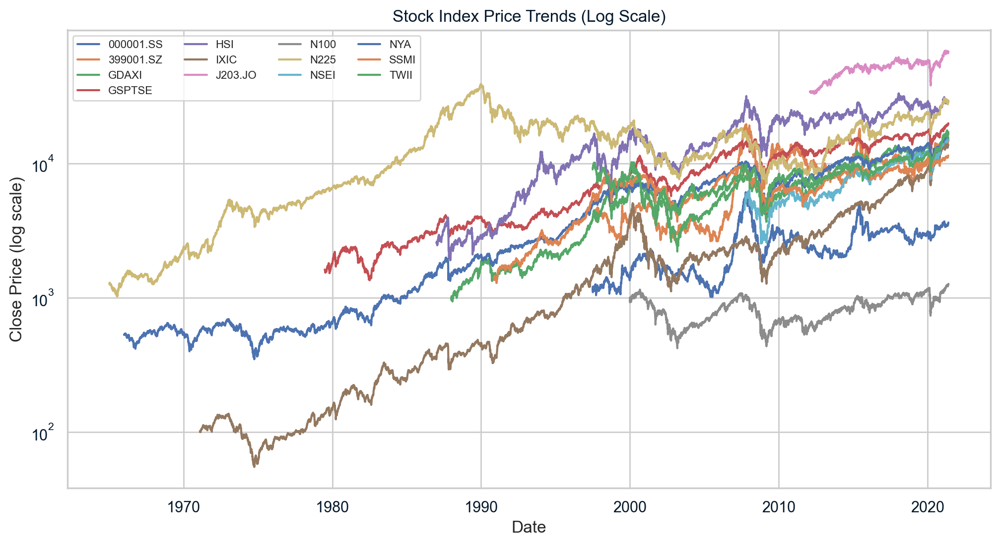

In [19]:
# ---- 3. Price Trends (Log Scale)
plt.figure(figsize=(12,6))
for t in df['ticker'].unique():
    subset = df[df['ticker'] == t]
    plt.plot(subset['date'], subset['close'], label=t)
plt.yscale('log')
plt.title("Stock Index Price Trends (Log Scale)")
plt.xlabel("Date")
plt.ylabel("Close Price (log scale)")
plt.legend(ncol=4, fontsize=8)
plt.show()

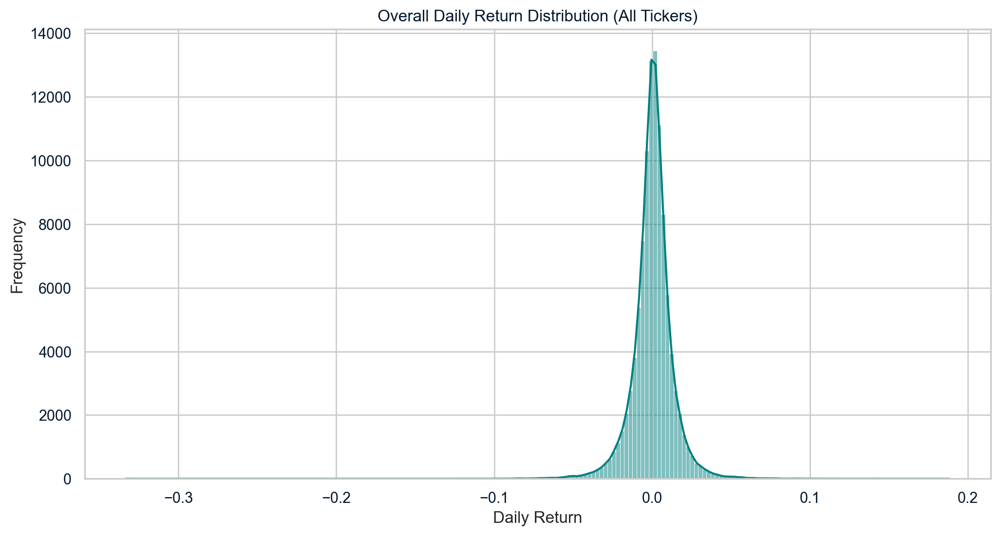

In [20]:
# ---- 4. Return Distributions (KDE + Histogram)
plt.figure(figsize=(12,6))
sns.histplot(df['return'].dropna(), bins=200, kde=True, color='teal')
plt.title("Overall Daily Return Distribution (All Tickers)")
plt.xlabel("Daily Return")
plt.ylabel("Frequency")
plt.show()

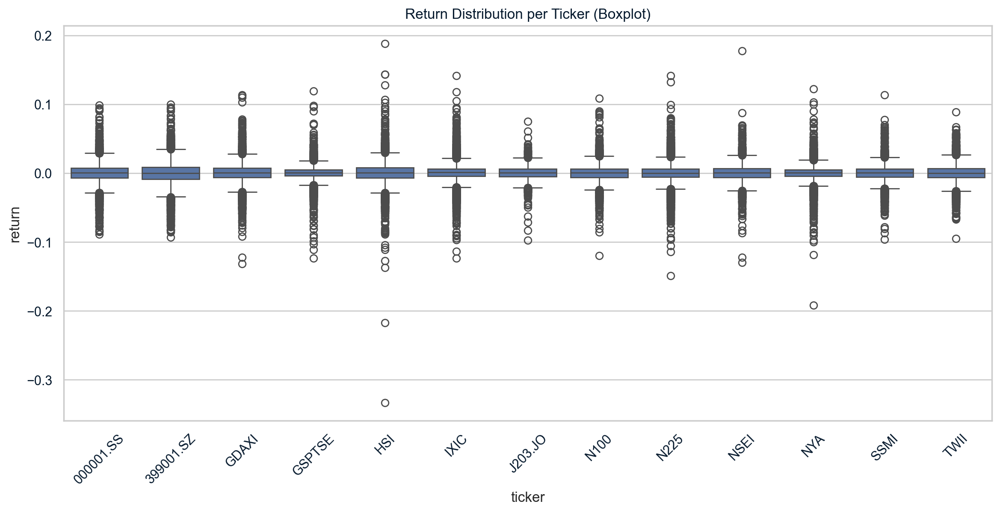

In [21]:
# ---- 5. Boxplot by ticker
plt.figure(figsize=(14,6))
sns.boxplot(data=df, x='ticker', y='return')
plt.title("Return Distribution per Ticker (Boxplot)")
plt.xticks(rotation=45)
plt.show()


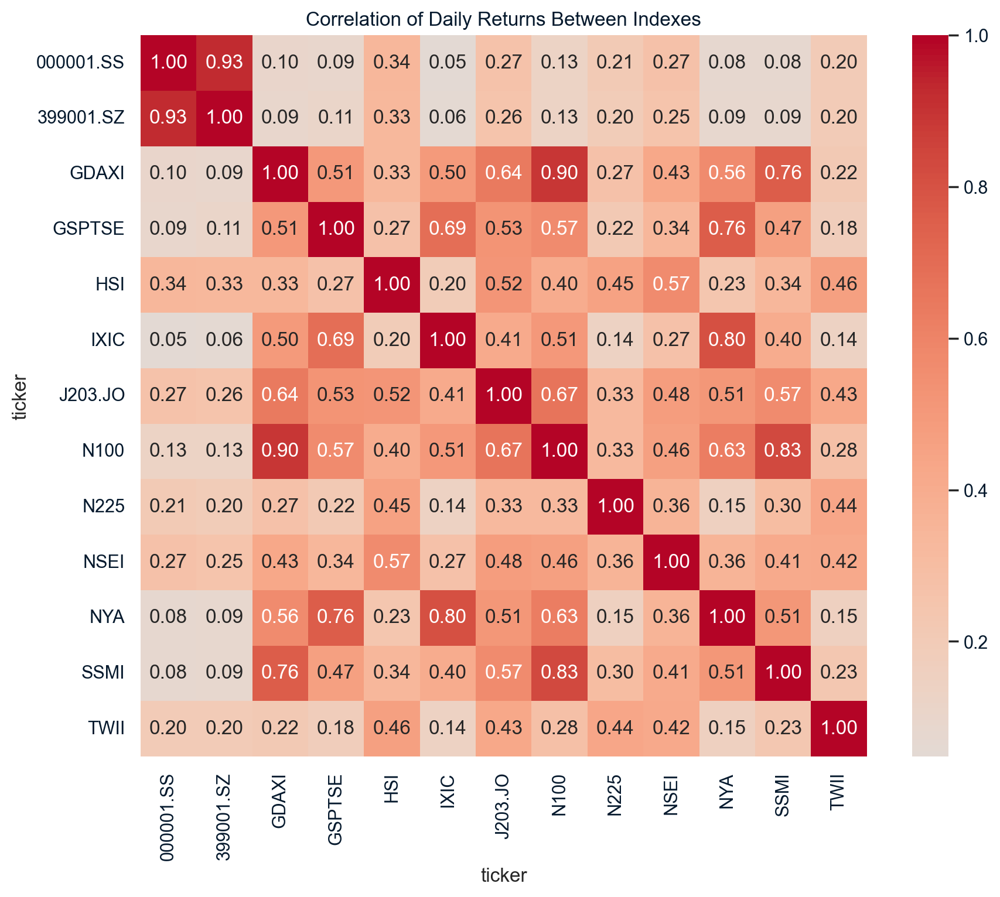

In [22]:
# ---- 6. Correlation Heatmap (Average Returns per Date)
pivot_returns = df.pivot(index='date', columns='ticker', values='return')
corr_matrix = pivot_returns.corr()

plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title("Correlation of Daily Returns Between Indexes")
plt.show()

In [23]:
# ---- 7. Interactive Chart (Plotly) — Price Over Time
fig = px.line(df, x='date', y='close', color='ticker',
              title="Interactive Stock Index Prices",
              labels={'close': 'Close Price', 'date': 'Date'},
              template="plotly_dark")
fig.update_yaxes(type="log")  # log scale for comparability
fig.show()

In [24]:
# ---- 8. Crisis periods
crisis_periods = {
    "Dot-com Bubble Burst": ("2000-03-01", "2002-10-01"),
    "Global Financial Crisis": ("2008-09-01", "2009-03-01"),
    "COVID-19 Crash": ("2020-02-15", "2020-03-31")
}

performance_rows = []

for name, (start, end) in crisis_periods.items():
    start_date = pd.to_datetime(start)
    end_date = pd.to_datetime(end)

    for t in df['ticker'].unique():
        subset = df[(df['ticker'] == t) &
                    (df['date'] >= start_date) &
                    (df['date'] <= end_date)].copy()

        if subset.empty:
            continue

        # Performance during crisis
        start_price = subset.iloc[0]['close']
        end_price = subset.iloc[-1]['close']
        crisis_return = (end_price / start_price) - 1

        # Volatility during crisis (annualized)
        vol = subset['return'].std() * np.sqrt(252)

        # Recovery in 1 year after crisis
        recovery_start = end_date
        recovery_end = end_date + pd.DateOffset(years=1)

        recovery_data = df[(df['ticker'] == t) &
                           (df['date'] > recovery_start) &
                           (df['date'] <= recovery_end)]

        if not recovery_data.empty:
            rec_price_start = recovery_data.iloc[0]['close']
            rec_price_end = recovery_data.iloc[-1]['close']
            recovery_return = (rec_price_end / rec_price_start) - 1
        else:
            recovery_return = np.nan

        performance_rows.append({
            "Crisis": name,
            "Ticker": t,
            "Crisis Return %": crisis_return * 100,
            "Volatility % (ann.)": vol * 100,
            "Recovery Return % (1yr after)": recovery_return * 100
        })

# Create DataFrame
crisis_perf = pd.DataFrame(performance_rows)

# Round for display
crisis_perf = crisis_perf.round(2)

# Sort by Crisis, then by performance
crisis_perf = crisis_perf.sort_values(by=["Crisis", "Crisis Return %"])

display(crisis_perf)


,Crisis,Ticker,Crisis Return %,Volatility % (ann.),Recovery Return % (1yr after)
32,COVID-19 Crash,NSEI,-28.6200,66.4000,77.9900
25,COVID-19 Crash,GDAXI,-27.9200,62.5600,57.2400
30,COVID-19 Crash,N100,-27.0600,61.6300,44.3500
33,COVID-19 Crash,NYA,-26.6200,78.8900,58.4800
26,COVID-19 Crash,GSPTSE,-25.0800,82.7700,45.2300
29,COVID-19 Crash,J203.JO,-23.5400,63.6700,52.0300
28,COVID-19 Crash,IXIC,-20.8800,78.1000,79.9700
31,COVID-19 Crash,N225,-19.5800,49.8300,61.5200
35,COVID-19 Crash,TWII,-17.4700,40.4800,70.0300
34,COVID-19 Crash,SSMI,-16.6200,52.1200,20.4900


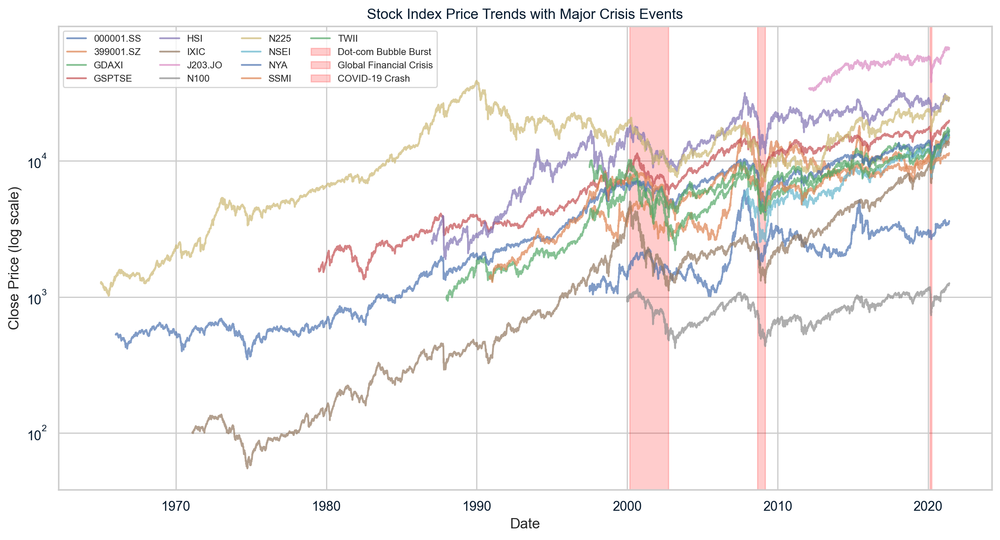

In [25]:
# ---- 9.  Major crisis events with approximate dates
events = [
    ("Dot-com Bubble Burst", "2000-03-01", "2002-10-01"),
    ("Global Financial Crisis", "2008-09-01", "2009-03-01"),
    ("COVID-19 Crash", "2020-02-15", "2020-03-31"),
]

# Plot all tickers with log scale
fig, ax = plt.subplots(figsize=(14, 7))

for t in df['ticker'].unique():
    subset = df[df['ticker'] == t]
    ax.plot(subset['date'], subset['close'], label=t, alpha=0.7)

# Add shaded regions for crises
for label, start, end in events:
    ax.axvspan(pd.to_datetime(start), pd.to_datetime(end),
               color='red', alpha=0.2, label=label)

# Formatting
ax.set_yscale('log')
ax.set_title("Stock Index Price Trends with Major Crisis Events")
ax.set_xlabel("Date")
ax.set_ylabel("Close Price (log scale)")
ax.legend(loc='upper left', ncol=4, fontsize=8)
plt.show()


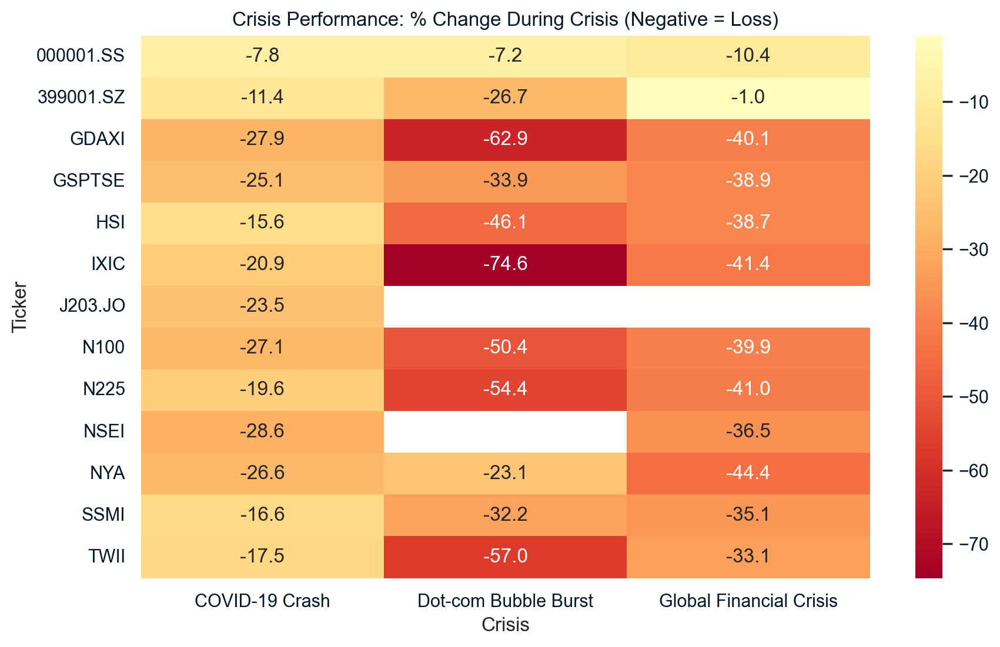

In [26]:
# ---- 10. Heatmap — Crisis Loss %
pivot_loss = crisis_perf.pivot(index="Ticker", columns="Crisis", values="Crisis Return %")

plt.figure(figsize=(10,6))
sns.heatmap(pivot_loss, annot=True, fmt=".1f", cmap="RdYlGn", center=0)
plt.title("Crisis Performance: % Change During Crisis (Negative = Loss)")
plt.ylabel("Ticker")
plt.xlabel("Crisis")
plt.show()

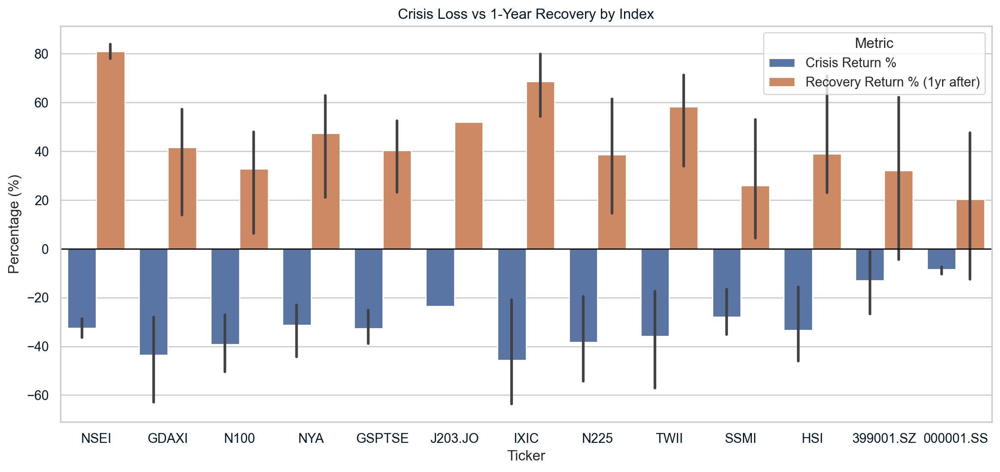

In [27]:
# ---- 11. Grouped Bar Chart — Crisis Loss vs Recovery
melted = crisis_perf.melt(
    id_vars=["Crisis", "Ticker"],
    value_vars=["Crisis Return %", "Recovery Return % (1yr after)"],
    var_name="Metric",
    value_name="Percentage"
)

plt.figure(figsize=(14,6))
sns.barplot(data=melted, x="Ticker", y="Percentage", hue="Metric")
plt.axhline(0, color="black", linewidth=1)
plt.title("Crisis Loss vs 1-Year Recovery by Index")
plt.ylabel("Percentage (%)")
plt.xlabel("Ticker")
plt.legend(title="Metric")
plt.show()

In [28]:
# ---- 12. Interactive Return Volatility Over Time
rolling_vol = df.groupby('ticker').apply(
    lambda x: x.set_index('date')['return'].rolling(30).std() * np.sqrt(252)
).reset_index().rename(columns={'return': 'rolling_vol'})

fig_vol = px.line(rolling_vol, x='date', y='rolling_vol', color='ticker',
                  title="30-Day Rolling Annualized Volatility",
                  labels={'rolling_vol': 'Volatility'},
                  template="plotly_white")
fig_vol.show()

# Market Profiling (Understanding the market)

## Volatility and Risk

=== Risk–Return table (sorted by Sharpe) ===


,Ticker,Ann_Return,Ann_Volatility,Sharpe,VaR_95,CVaR_95
0,IXIC,0.1027,0.1989,0.5914,-0.0197,-0.0309
1,NSEI,0.0982,0.2272,0.5260,-0.0204,-0.0334
2,J203.JO,0.0765,0.1676,0.5240,-0.0164,-0.0244
3,GDAXI,0.0850,0.2231,0.4773,-0.0217,-0.0331
4,SSMI,0.0717,0.1796,0.4757,-0.0172,-0.0270
5,NYA,0.0642,0.1626,0.4645,-0.0151,-0.0239
6,GSPTSE,0.0617,0.1566,0.4611,-0.0142,-0.0242
7,HSI,0.0748,0.2561,0.4119,-0.0233,-0.0373
8,N225,0.0587,0.2018,0.3838,-0.0200,-0.0304
9,399001.SZ,0.0564,0.2783,0.3366,-0.0268,-0.0421


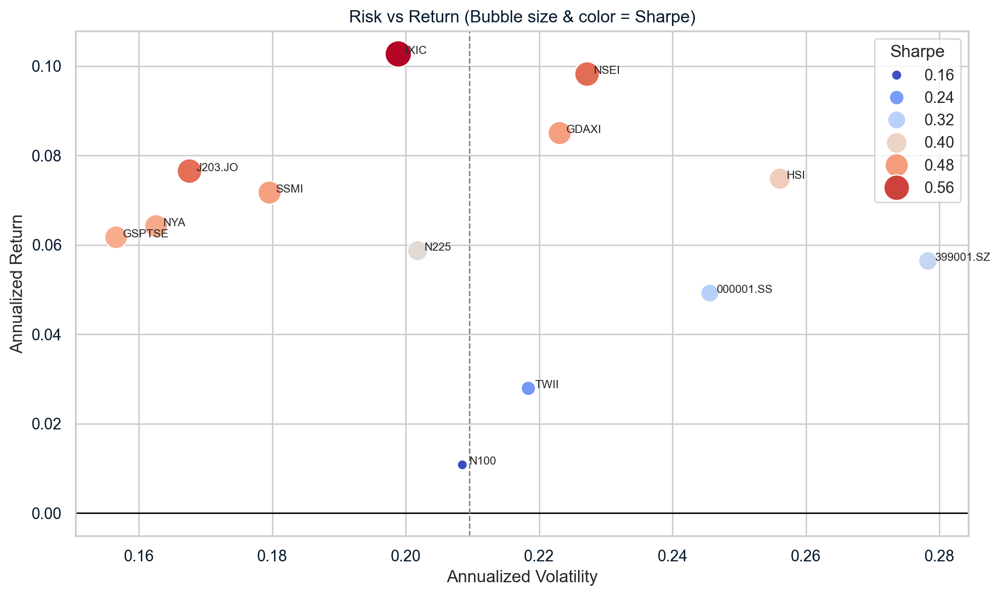

In [29]:
# ---- 1.  Risk–return table + bubble chart 
def sharpe_ratio(r, rf=0.0, annualization=252):
    r = pd.Series(r).dropna()
    if r.empty: return np.nan
    er = r.mean() - rf/annualization
    vol = r.std()
    return (er/vol)*np.sqrt(annualization) if vol and vol>0 else np.nan

risk_rows = []
for t, d in df.groupby('ticker'):
    r = d['return'].dropna()
    if len(r) < 252: 
        continue
    ann_return = (1 + r).prod()**(252/len(r)) - 1
    ann_vol     = r.std() * np.sqrt(252)
    sr          = sharpe_ratio(r)
    var_95      = np.percentile(r, 5)   # Historical daily VaR at 95% (loss threshold)
    cvar_95     = r[r <= var_95].mean() # CVaR (expected shortfall)
    risk_rows.append((t, ann_return, ann_vol, sr, var_95, cvar_95))

risk_table = pd.DataFrame(risk_rows,
                          columns=['Ticker','Ann_Return','Ann_Volatility','Sharpe','VaR_95','CVaR_95']).round(4)
risk_table = risk_table.sort_values('Sharpe', ascending=False).reset_index(drop=True)

print("=== Risk–Return table (sorted by Sharpe) ===")
display(risk_table)

# Bubble chart: risk vs return (bubble = Sharpe)
plt.figure(figsize=(10,6))
sns.scatterplot(data=risk_table, x='Ann_Volatility', y='Ann_Return', size='Sharpe', hue='Sharpe',
                palette='coolwarm', sizes=(50,350), legend='brief')
for _, row in risk_table.iterrows():
    plt.text(row['Ann_Volatility']+0.001, row['Ann_Return'], row['Ticker'], fontsize=8)
plt.title("Risk vs Return (Bubble size & color = Sharpe)")
plt.xlabel("Annualized Volatility")
plt.ylabel("Annualized Return")
plt.axhline(0, color='black', lw=1)
plt.axvline(risk_table['Ann_Volatility'].mean(), color='grey', ls='--', lw=1)
plt.tight_layout(); plt.show()


Focus ticker: NYA


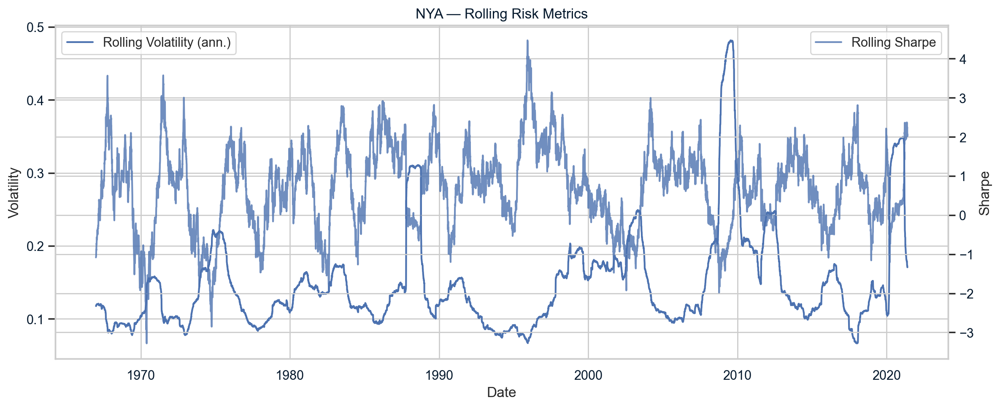

In [30]:
# ---- 2. Rolling volatility & rolling Sharpe (time-varying risk)
# Choose a ticker to inspect
focus = df['ticker'].value_counts().idxmax()  # most frequent as default
print("Focus ticker:", focus)

d = df[df['ticker']==focus].copy().sort_values('date')
window = 252  # ~1 trading year

d['roll_vol_ann'] = d['return'].rolling(window).std() * np.sqrt(252)
d['roll_mean']    = d['return'].rolling(window).mean()
d['roll_sharpe']  = (d['roll_mean'] / d['return'].rolling(window).std()) * np.sqrt(252)

fig, ax = plt.subplots(figsize=(12,5))
ax.plot(d['date'], d['roll_vol_ann'], label='Rolling Volatility (ann.)')
ax.set_ylabel('Volatility'); ax.set_xlabel('Date'); ax.set_title(f'{focus} — Rolling Risk Metrics')
ax2 = ax.twinx()
ax2.plot(d['date'], d['roll_sharpe'], label='Rolling Sharpe', alpha=0.8)
ax2.set_ylabel('Sharpe')
ax.legend(loc='upper left'); ax2.legend(loc='upper right')
plt.tight_layout(); plt.show()

Top 5 by Sharpe


,Ticker,Ann_Return,Ann_Volatility,Sharpe,VaR_95,CVaR_95
0,IXIC,0.1027,0.1989,0.5914,-0.0197,-0.0309
1,NSEI,0.0982,0.2272,0.5260,-0.0204,-0.0334
2,J203.JO,0.0765,0.1676,0.5240,-0.0164,-0.0244
3,GDAXI,0.0850,0.2231,0.4773,-0.0217,-0.0331
4,SSMI,0.0717,0.1796,0.4757,-0.0172,-0.0270


Bottom 5 by Sharpe


,Ticker,Ann_Return,Ann_Volatility,Sharpe,VaR_95,CVaR_95
8,N225,0.0587,0.2018,0.3838,-0.0200,-0.0304
9,399001.SZ,0.0564,0.2783,0.3366,-0.0268,-0.0421
10,000001.SS,0.0492,0.2456,0.3187,-0.0237,-0.0377
11,TWII,0.0279,0.2184,0.2353,-0.0227,-0.0332
12,N100,0.0108,0.2085,0.1561,-0.0208,-0.0317


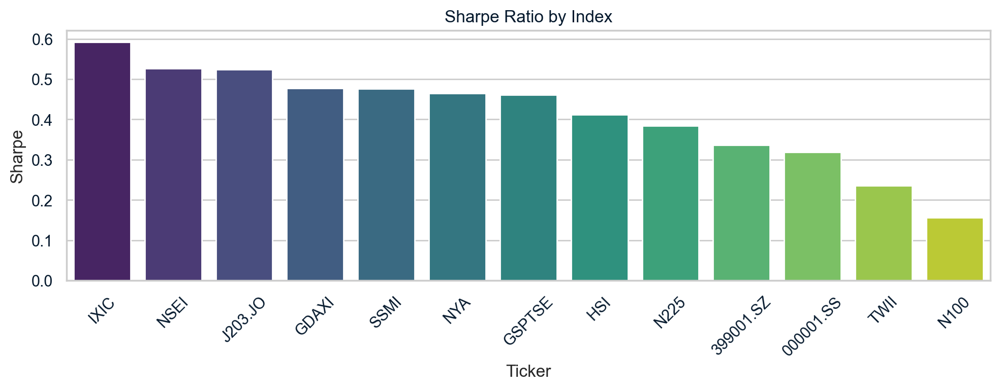

In [31]:
# ---- 3. Cross‑sectional comparison (top/bottom by Sharpe)
top = risk_table.head(5).copy(); bottom = risk_table.tail(5).copy()
print("Top 5 by Sharpe"); display(top)
print("Bottom 5 by Sharpe"); display(bottom)

plt.figure(figsize=(10,4))
sns.barplot(data=risk_table.sort_values('Sharpe', ascending=False),
            x='Ticker', y='Sharpe', palette='viridis')
plt.title("Sharpe Ratio by Index"); plt.xticks(rotation=45); plt.tight_layout(); plt.show()


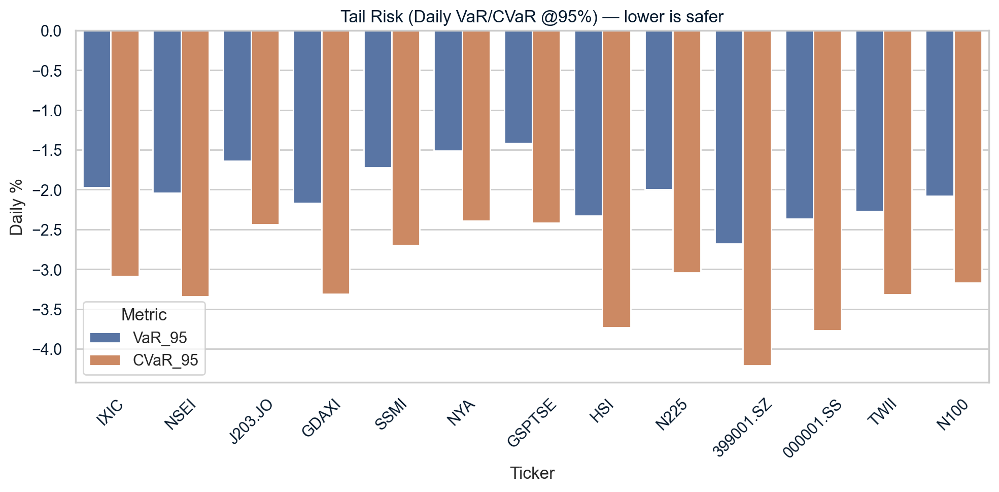

In [32]:
# ---- 4. Tail-risk view (VaR & CVaR)

m = risk_table[['Ticker','VaR_95','CVaR_95']].melt(id_vars='Ticker',
                                                   var_name='Metric', value_name='Daily %')
m['Daily %'] = m['Daily %']*100
plt.figure(figsize=(10,5))
sns.barplot(data=m, x='Ticker', y='Daily %', hue='Metric')
plt.title("Tail Risk (Daily VaR/CVaR @95%) — lower is safer"); plt.xticks(rotation=45)
plt.axhline(0, color='black', lw=1); plt.tight_layout(); plt.show()


# Backtesting - Golden Cross Backtest

- Test Golden Cross (SMA50 > SMA200 → long, else cash).
- Compare to Buy & Hold.
- Get metrics (Total Return, CAGR, Volatility, Sharpe, Max Drawdown).
- Plot equity curves.
- Run across all tickers to see where it works best.

=== Golden Cross Backtest: NYA ===


,Metric,Buy & Hold,Golden Cross
0,Total Return,30.3145,14.5152
1,CAGR,0.0642,0.0508
2,Volatility (ann.),0.1626,0.1146
3,Sharpe,0.4645,0.4903
4,Max Drawdown,-0.5901,-0.3747


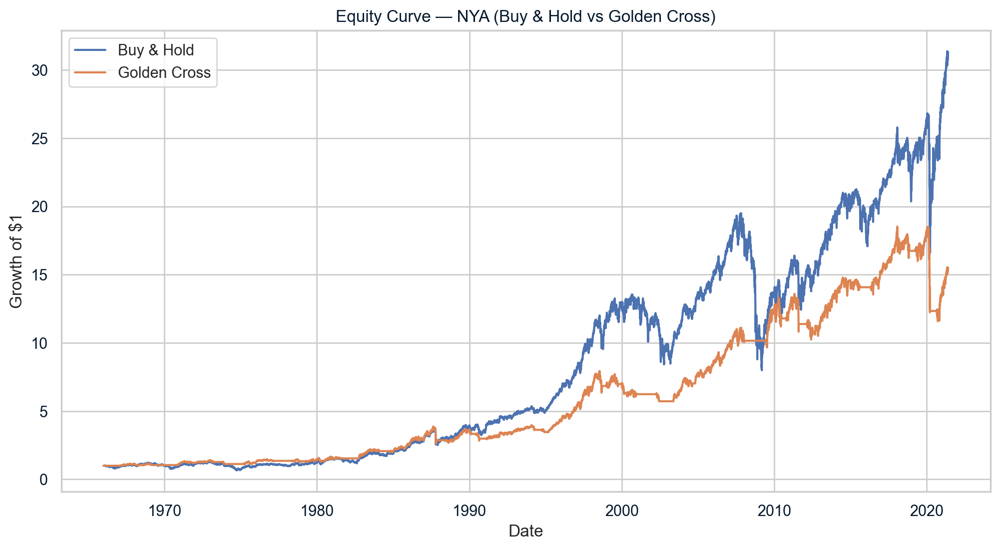

In [33]:
# ---- Helper functions for Golden Cross strategy
def add_sma_cols(d):
    d = d.sort_values('date').copy()
    d['sma_50'] = d['close'].rolling(50).mean()
    d['sma_200'] = d['close'].rolling(200).mean()
    return d

def backtest_golden_cross(d, annualization=252):
    d = add_sma_cols(d)
    d['signal'] = (d['sma_50'] > d['sma_200']).astype(int)
    d['strategy_ret'] = d['signal'].shift(1) * d['return']
    d['cum_bh'] = (1 + d['return']).cumprod()
    d['cum_strat'] = (1 + d['strategy_ret'].fillna(0)).cumprod()

    # Performance metrics
    def perf(r):
        total_return = (1 + r).prod() - 1
        cagr = (1 + total_return) ** (annualization / len(r)) - 1 if len(r) > 0 else np.nan
        vol = r.std() * np.sqrt(annualization)
        sharpe = (r.mean() * annualization) / vol if vol and vol > 0 else np.nan
        return total_return, cagr, vol, sharpe

    bh_metrics = perf(d['return'].dropna())
    strat_metrics = perf(d['strategy_ret'].dropna())

    # Max Drawdown
    def max_drawdown(equity_curve):
        roll_max = equity_curve.cummax()
        dd = equity_curve / roll_max - 1.0
        return dd.min()

    mdd_bh = max_drawdown(d['cum_bh'].fillna(1))
    mdd_strat = max_drawdown(d['cum_strat'].fillna(1))

    metrics = pd.DataFrame({
        'Metric': ['Total Return','CAGR','Volatility (ann.)','Sharpe','Max Drawdown'],
        'Buy & Hold': [bh_metrics[0], bh_metrics[1], bh_metrics[2], bh_metrics[3], mdd_bh],
        'Golden Cross': [strat_metrics[0], strat_metrics[1], strat_metrics[2], strat_metrics[3], mdd_strat]
    }).round(4)

    return d, metrics

# --- Example: Run for a single ticker
ticker = df['ticker'].value_counts().idxmax()  # most frequent ticker
data_ticker = df[df['ticker'] == ticker].copy()
bt_results, metrics = backtest_golden_cross(data_ticker)

print(f"=== Golden Cross Backtest: {ticker} ===")
display(metrics)

# --- Plot equity curves
plt.figure(figsize=(12,6))
plt.plot(bt_results['date'], bt_results['cum_bh'], label='Buy & Hold')
plt.plot(bt_results['date'], bt_results['cum_strat'], label='Golden Cross')
plt.title(f"Equity Curve — {ticker} (Buy & Hold vs Golden Cross)")
plt.xlabel("Date"); plt.ylabel("Growth of $1")
plt.legend(); plt.show()


In [34]:
all_metrics = []

for t in df['ticker'].unique():
    d_t = df[df['ticker'] == t].copy()
    if len(d_t) < 200:  # need enough data for SMA200
        continue
    _, m = backtest_golden_cross(d_t)
    m = m.set_index('Metric').T
    m['Ticker'] = t
    all_metrics.append(m)

multi_results = pd.concat(all_metrics)
display(multi_results.sort_values('Sharpe', ascending=False))


Metric,Total Return,CAGR,Volatility (ann.),Sharpe,Max Drawdown,Ticker
Golden Cross,53.3946,0.0826,0.1442,0.6229,-0.4625,IXIC
Buy & Hold,136.4874,0.1027,0.1989,0.5914,-0.7793,IXIC
Buy & Hold,2.4670,0.0982,0.2272,0.5260,-0.5986,NSEI
Buy & Hold,0.9857,0.0765,0.1676,0.5240,-0.3846,J203.JO
Golden Cross,4.4316,0.0572,0.1207,0.5212,-0.4517,SSMI
Golden Cross,14.5152,0.0508,0.1146,0.4903,-0.3747,NYA
Golden Cross,6.6385,0.0626,0.1507,0.4788,-0.4493,GDAXI
Buy & Hold,14.3415,0.0850,0.2231,0.4773,-0.7268,GDAXI
Buy & Hold,7.2374,0.0717,0.1796,0.4757,-0.5631,SSMI
Golden Cross,5.6292,0.0463,0.1096,0.4687,-0.4333,GSPTSE


# Drawdown Analysis (for the back test ran)

In [35]:
# ---- 1. Helper to compute drawdown series
def drawdown_series(equity_curve: pd.Series) -> pd.Series:
    peak = equity_curve.cummax()
    dd = equity_curve / peak - 1.0
    return dd


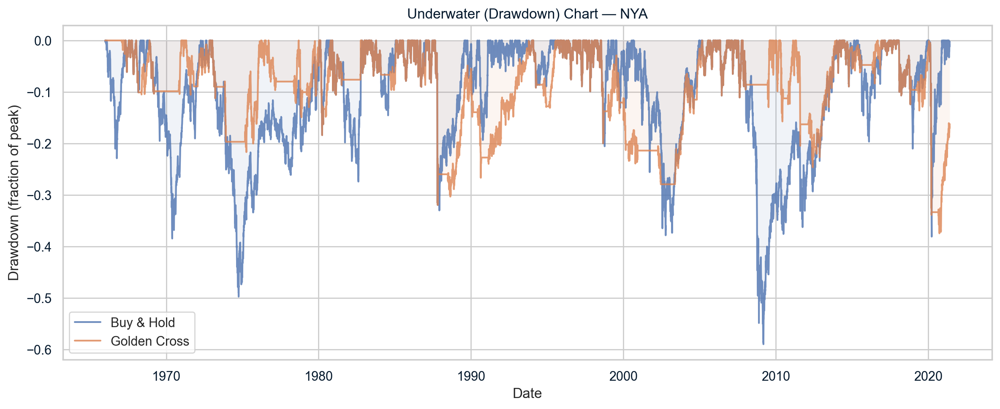

In [36]:
# ---- 2. Helper to compute drawdown series
# Uses bt_results from the last backtest cell
bh_eq   = bt_results['cum_bh'].fillna(1.0)
str_eq  = bt_results['cum_strat'].fillna(1.0)

bh_dd  = drawdown_series(bh_eq)
str_dd = drawdown_series(str_eq)

fig, ax = plt.subplots(figsize=(12,5))
ax.plot(bt_results['date'], bh_dd, label='Buy & Hold', alpha=0.8)
ax.plot(bt_results['date'], str_dd, label='Golden Cross', alpha=0.8)
ax.fill_between(bt_results['date'], 0, bh_dd, alpha=0.08)
ax.fill_between(bt_results['date'], 0, str_dd, alpha=0.08)
ax.set_title(f"Underwater (Drawdown) Chart — {ticker}")
ax.set_ylabel("Drawdown (fraction of peak)")
ax.set_xlabel("Date")
ax.legend()
plt.tight_layout(); plt.show()


In [37]:
# ---- 3. Top drawdowns table (depth + length)
def top_drawdowns(dd: pd.Series, k=5):
    # identify drawdown episodes (peak→trough→recovery)
    s = dd.copy()
    in_dd = False
    episodes = []
    peak_date = trough_date = recov_date = None
    peak_level = 0.0

    for dt, val in s.items():
        if not in_dd:
            if val < 0:
                in_dd = True
                peak_date = dt
                peak_level = 0.0
                trough_date = dt
                trough_val = val
        else:
            if val < trough_val:
                trough_val = val
                trough_date = dt
            if val == 0:  # recovered
                in_dd = False
                recov_date = dt
                episodes.append((peak_date, trough_date, recov_date, trough_val))

    # If last drawdown never recovered, close it at the last date
    if in_dd:
        episodes.append((peak_date, trough_date, dd.index[-1], trough_val))

    df_dd = pd.DataFrame(episodes, columns=['PeakDate','TroughDate','RecoveryDate','Depth'])
    df_dd['Depth_%'] = (df_dd['Depth']*100).round(2)
    
    # Ensure the date columns are in datetime format
    df_dd['PeakDate'] = pd.to_datetime(df_dd['PeakDate'])
    df_dd['TroughDate'] = pd.to_datetime(df_dd['TroughDate'])
    df_dd['RecoveryDate'] = pd.to_datetime(df_dd['RecoveryDate'])
    
    df_dd['Days_Peak_to_Trough'] = (df_dd['TroughDate'] - df_dd['PeakDate']).dt.days
    df_dd['Days_To_Recovery']    = (df_dd['RecoveryDate'] - df_dd['TroughDate']).dt.days
    return df_dd.sort_values('Depth').head(k)

print("Top drawdowns — Buy & Hold")
display(top_drawdowns(bh_dd))

print("Top drawdowns — Golden Cross")
display(top_drawdowns(str_dd))

Top drawdowns — Buy & Hold


,PeakDate,TroughDate,RecoveryDate,Depth,Depth_%,Days_Peak_to_Trough,Days_To_Recovery
330,1970-01-01 00:00:00.000087267,1970-01-01 00:00:00.000087605,1970-01-01 00:00:00.000088815,-0.5901,-59.0100,0,0
33,1970-01-01 00:00:00.000078482,1970-01-01 00:00:00.000078917,1970-01-01 00:00:00.000080260,-0.4977,-49.7700,0,0
22,1970-01-01 00:00:00.000077448,1970-01-01 00:00:00.000077816,1970-01-01 00:00:00.000078293,-0.3849,-38.4900,0,0
384,1970-01-01 00:00:00.000090341,1970-01-01 00:00:00.000090384,1970-01-01 00:00:00.000090556,-0.3811,-38.1100,0,0
270,1970-01-01 00:00:00.000085468,1970-01-01 00:00:00.000085992,1970-01-01 00:00:00.000086546,-0.3785,-37.8500,0,0


Top drawdowns — Golden Cross


,PeakDate,TroughDate,RecoveryDate,Depth,Depth_%,Days_Peak_to_Trough,Days_To_Recovery
326,1970-01-01 00:00:00.000089844,1970-01-01 00:00:00.000090512,1970-01-01 00:00:00.000090683,-0.3747,-37.4700,0,0
129,1970-01-01 00:00:00.000082176,1970-01-01 00:00:00.000082218,1970-01-01 00:00:00.000083788,-0.3198,-31.9800,0,0
204,1970-01-01 00:00:00.000084930,1970-01-01 00:00:00.000085910,1970-01-01 00:00:00.000086596,-0.2795,-27.9500,0,0
282,1970-01-01 00:00:00.000088147,1970-01-01 00:00:00.000088422,1970-01-01 00:00:00.000088813,-0.2464,-24.6400,0,0
37,1970-01-01 00:00:00.000078482,1970-01-01 00:00:00.000079044,1970-01-01 00:00:00.000079289,-0.2169,-21.6900,0,0


In [38]:
# ---- 4. Side‑by‑side summary (risk emphasis)
dd_summary = pd.DataFrame({
    'Metric': ['Max Drawdown','Avg Drawdown (non‑zero)','% time in drawdown'],
    'Buy & Hold': [
        bh_dd.min(),
        bh_dd[bh_dd<0].mean(),
        (bh_dd<0).mean()
    ],
    'Golden Cross': [
        str_dd.min(),
        str_dd[str_dd<0].mean(),
        (str_dd<0).mean()
    ]
}).round(4)

display(dd_summary)


,Metric,Buy & Hold,Golden Cross
0,Max Drawdown,-0.5901,-0.3747
1,Avg Drawdown (non‑zero),-0.1112,-0.0968
2,% time in drawdown,0.9373,0.9284


,Ticker,BH_MaxDD,GC_MaxDD
1,399001.SZ,-0.7098,-0.5494
0,000001.SS,-0.7198,-0.5350
5,IXIC,-0.7793,-0.4625
4,HSI,-0.6518,-0.4573
11,SSMI,-0.5631,-0.4517
2,GDAXI,-0.7268,-0.4493
3,GSPTSE,-0.4999,-0.4333
8,N225,-0.8187,-0.4306
7,N100,-0.6341,-0.4287
9,NSEI,-0.5986,-0.4186


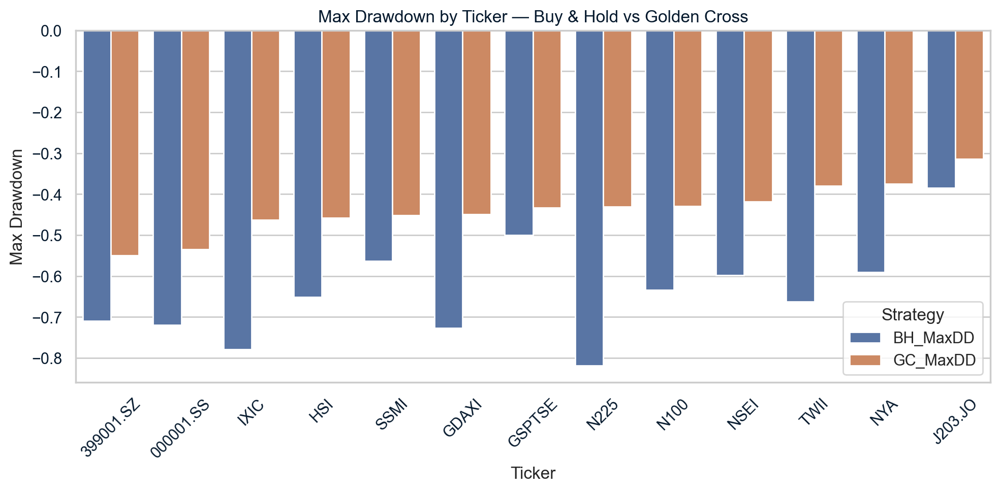

In [39]:
# ---- 5. All tickers drawdown
rows = []
for t in df['ticker'].unique():
    d = df[df['ticker']==t].copy()
    if len(d) < 220: 
        continue
    tmp, m = backtest_golden_cross(d)
    bh_dd  = drawdown_series(tmp['cum_bh'].fillna(1.0))
    st_dd  = drawdown_series(tmp['cum_strat'].fillna(1.0))
    rows.append({'Ticker': t, 'BH_MaxDD': bh_dd.min(), 'GC_MaxDD': st_dd.min()})

dd_comp = pd.DataFrame(rows).sort_values('GC_MaxDD', ascending=True)
display(dd_comp)

plt.figure(figsize=(10,5))
ddm = dd_comp.melt(id_vars='Ticker', value_vars=['BH_MaxDD','GC_MaxDD'],
                   var_name='Strategy', value_name='Max Drawdown')
sns.barplot(data=ddm, x='Ticker', y='Max Drawdown', hue='Strategy')
plt.title('Max Drawdown by Ticker — Buy & Hold vs Golden Cross')
plt.xticks(rotation=45); plt.tight_layout(); plt.show()
